
<div style="border-radius:10px;
            border : #015a2c solid;
            background-color:#D7D9DB;
           font-size:110%;
           letter-spacing:0.5px;
            text-align: center">
​
<center><h1 style="padding: 25px 0px; color:#015a4c; font-weight: bold; font-family: Cursive">
Amit Project for Data Science Module <br><br>💡💡💡💡💡 <br><br> DEPI_BS_DS_R3  </h1></center>
<center><h3 style="padding-bottom: 25px; color:#025b2c; font-weight: bold; font-style:italic; font-family: Cursive">
Using Project: Trip data Ford go bike  </h3></center>     
​
</div>

# Part I - (Dataset Exploration for Ford GoBike)

### worked by (Your Name/2025 )

## Introduction

.

> **Let's introduce our dataset:**


======================================

.

**This data set information was produced from `Ford GoBike` System** the information in it talked about individual rides that were made in a bike-sharing system for covering San Francisco Bay area.** 

.




> ## And here are the main exploring questions 



   **==================================================**



- What is the structure of your dataset?


- What are the main interesting features in the dataset?


- What features in the dataset supported my investigation for these interesting features?




.

> ### Also here are the investigative questions classified into three types



   **================================================**
   
   


###  <a href='#011'> Univariate Exploration</a> 

- <a href='#1'> 1 ) . What is the distribution of `User type`?</a>  
- <a href='#2'> 2 ) . What is the distribution for the `bike share users on all Trips`?</a>  
- <a href='#3'> 3 ) . What is the distribution for users' `ages`?</a>  
- <a href='#4'> 4 ) . Do the users' ages have `outlier` values?</a>
- <a href='#5'> 5 ) . What is the distribution for the trip duration in `minutes`? </a>
- <a href='#6'> 6) . What is the distribution for `member_gender`? </a>
- <a href='#7'> 7) . What is the distribution for the trip duration in `Hours`?  </a>




##  <a href='#111'> Bivariate Exploration</a> 


- <a href='#8'> 8 ) . What the `average duration` of trip for the categories of `user type`? </a>
- <a href='#9'> 9 ) . How long is the duration of the trip for `each gender` in `minutes`? </a>
- <a href='#10'> 10 ) . How long is the duration of the trip for each `user_type` in `minutes`?  </a>
- <a href='#11'> 11 ) . How the user distribution depending on their `Age` and `user_type` ?</a>
- <a href='#12'>12 ). How the user distribution depending on their `Age` and `member_gender` ?  </a>


##  <a href='#1111'> Multivariate Exploration</a> 


- <a href='#13'> 13 ) . What is the Correlation between `each` variable in the dataset?</a>  
- <a href='#14'> 14 ) . What is the Correlation between `specific numeric variables` in the dataset?</a>  
- <a href='#15'> 15 ) . What is the  Correlation between `data_stat` variables in the dataset?</a>  


##  <a href='#1100'> Conclusions </a> 





# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Import Libraries</p>

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt

import seaborn as sns
import plotly.subplots as sp
import plotly.graph_objects as go
import plotly.express as px
from category_encoders import OneHotEncoder

%matplotlib inline

In [2]:
# Load my dataset using pandas Dataframe

file_path = r'G:\DEPI\Depi_Amit_AI_BNS3\Tasks\DataBase\Final_project\fordgobike.csv'
df = pd.read_csv(file_path)

In [3]:
# here we make overview in high-level for data shape and composition

data_shape = df.shape
print(data_shape)

(183416, 16)


In [4]:
## check each var  datatype 

df.dtypes

duration_sec                 int64
start_time                  object
end_time                    object
start_station_id           float64
start_station_name          object
start_station_latitude     float64
start_station_longitude    float64
end_station_id             float64
end_station_name            object
end_station_latitude       float64
end_station_longitude      float64
bike_id                      int64
user_type                   object
member_birth_year          float64
member_gender               object
bike_share_for_all_trip     object
dtype: object

In [5]:
## I display 15 rows to understand the content values more 

df.head(15)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
0,52185,32:10.1,01:56.0,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,13.0,Commercial St at Montgomery St,37.794231,-122.402923,4902,Customer,1984.0,Male,No
1,42521,53:21.8,42:03.1,23.0,The Embarcadero at Steuart St,37.791464,-122.391034,81.0,Berry St at 4th St,37.775880,-122.393170,2535,Customer,NaN,NaN,No
2,61854,13:13.2,24:08.1,86.0,Market St at Dolores St,37.769305,-122.426826,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,5905,Customer,1972.0,Male,No
3,36490,54:26.0,02:36.8,375.0,Grove St at Masonic Ave,37.774836,-122.446546,70.0,Central Ave at Fell St,37.773311,-122.444293,6638,Subscriber,1989.0,Other,No
4,1585,54:18.5,20:44.1,7.0,Frank H Ogawa Plaza,37.804562,-122.271738,222.0,10th Ave at E 15th St,37.792714,-122.248780,4898,Subscriber,1974.0,Male,Yes
5,1793,49:58.6,19:51.8,93.0,4th St at Mission Bay Blvd S,37.770407,-122.391198,323.0,Broadway at Kearny,37.798014,-122.405950,5200,Subscriber,1959.0,Male,No
6,1147,55:35.1,14:42.6,300.0,Palm St at Willow St,37.317298,-121.884995,312.0,San Jose Diridon Station,37.329732,-121.901782,3803,Subscriber,1983.0,Female,No
7,1615,41:06.8,08:02.8,10.0,Washington St at Kearny St,37.795393,-122.404770,127.0,Valencia St at 21st St,37.756708,-122.421025,6329,Subscriber,1989.0,Male,No
8,1570,41:48.8,07:59.7,10.0,Washington St at Kearny St,37.795393,-122.404770,127.0,Valencia St at 21st St,37.756708,-122.421025,6548,Subscriber,1988.0,Other,No
9,1049,49:47.7,07:17.0,19.0,Post St at Kearny St,37.788975,-122.403452,121.0,Mission Playground,37.759210,-122.421339,6488,Subscriber,1992.0,Male,No


In [6]:
# descriptive statistics for numeric variables

df.describe()

,duration_sec,start_station_id,start_station_latitude,start_station_longitude,end_station_id,end_station_latitude,end_station_longitude,bike_id,member_birth_year
count,183416.000000,183219.000000,183416.000000,183416.000000,183219.000000,183416.000000,183416.000000,183416.000000,175151.000000
mean,726.067311,138.590365,37.771221,-122.352661,136.249401,37.771425,-122.352247,4472.890260,1984.806504
std,1794.371831,111.778938,0.099586,0.117100,111.514916,0.099494,0.116677,1664.386068,10.116589
min,61.000000,3.000000,37.317298,-122.453705,3.000000,37.317298,-122.453705,11.000000,1878.000000
25%,325.000000,47.000000,37.770083,-122.412408,44.000000,37.770407,-122.411726,3777.000000,1980.000000
50%,514.000000,104.000000,37.780760,-122.398285,100.000000,37.781010,-122.398279,4958.000000,1987.000000
75%,796.000000,239.000000,37.797280,-122.286533,235.000000,37.797320,-122.288045,5502.000000,1992.000000
max,85444.000000,398.000000,37.880222,-121.874119,398.000000,37.880222,-121.874119,6645.000000,2001.000000




> ### What is the structure of your dataset?





- The structure of the dataset contains  16 columns and 183416 rows.
 
 
- Most variables are numerical in nature , and here are **dtypes summary :**

        - float64(7)
        - int64(2)
        - object(7)
        



> ### What are the main interesting features in the dataset?




 **We got three main feature areas which are :**
 
 
 
 
- Age
 
 
 
- 
 
  
 
  
- 




> ### What features in the dataset supported my investigation for these interesting features?



- member_birth_year



- 



- 



-




- 




##  More Exploring ideas to begin my investigation

In [7]:
#This code for describing statistical data ideas in a more organized and readable table

def describe_stats(df):
    stats = pd.DataFrame({
        'Mean': df.mean(numeric_only=True),
        'Median': df.median(numeric_only=True),
        'Mode': df.mode(numeric_only=True).iloc[0],
        'Variance': df.var(numeric_only=True),
        'Min': df.min(numeric_only=True),
        'Max': df.max(numeric_only=True),
        'Range': df.max(numeric_only=True) - df.min(numeric_only=True),
        'Q1 (25%)': df.quantile(0.25, numeric_only=True),
        'Q3 (75%)': df.quantile(0.75, numeric_only=True),
    })
    return stats.T

# Usage
summary_table = describe_stats(df)
summary_table

,duration_sec,start_station_id,start_station_latitude,start_station_longitude,end_station_id,end_station_latitude,end_station_longitude,bike_id,member_birth_year
Mean,7.260673e+02,138.590365,37.771221,-122.352661,136.249401,37.771425,-122.352247,4.472890e+03,1984.806504
Median,5.140000e+02,104.000000,37.780760,-122.398285,100.000000,37.781010,-122.398279,4.958000e+03,1987.000000
Mode,2.720000e+02,58.000000,37.776619,-122.417385,67.000000,37.776639,-122.395526,4.794000e+03,1988.000000
Variance,3.219770e+06,12494.531087,0.009917,0.013712,12435.576442,0.009899,0.013614,2.770181e+06,102.345368
Min,6.100000e+01,3.000000,37.317298,-122.453705,3.000000,37.317298,-122.453705,1.100000e+01,1878.000000
Max,8.544400e+04,398.000000,37.880222,-121.874119,398.000000,37.880222,-121.874119,6.645000e+03,2001.000000
Range,8.538300e+04,395.000000,0.562925,0.579586,395.000000,0.562925,0.579586,6.634000e+03,123.000000
Q1 (25%),3.250000e+02,47.000000,37.770083,-122.412408,44.000000,37.770407,-122.411726,3.777000e+03,1980.000000
Q3 (75%),7.960000e+02,239.000000,37.797280,-122.286533,235.000000,37.797320,-122.288045,5.502000e+03,1992.000000


In [8]:
# display the information about each column

info = df.info()
info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183416 entries, 0 to 183415
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   duration_sec             183416 non-null  int64  
 1   start_time               183416 non-null  object 
 2   end_time                 183416 non-null  object 
 3   start_station_id         183219 non-null  float64
 4   start_station_name       183219 non-null  object 
 5   start_station_latitude   183416 non-null  float64
 6   start_station_longitude  183416 non-null  float64
 7   end_station_id           183219 non-null  float64
 8   end_station_name         183219 non-null  object 
 9   end_station_latitude     183416 non-null  float64
 10  end_station_longitude    183416 non-null  float64
 11  bike_id                  183416 non-null  int64  
 12  user_type                183416 non-null  object 
 13  member_birth_year        175151 non-null  float64
 14  memb

## <mark>The above result show some missing values exist in some columns So let's display them </mark>

In [9]:
#yOUR CODES

df.isnull().sum()[df.isnull().sum() > 0]

start_station_id       197
start_station_name     197
end_station_id         197
end_station_name       197
member_birth_year     8265
member_gender         8265
dtype: int64



> ## <mark>The result above shows many missing data </mark>



###  To fix this issue You will fill these values with ........... for numeric and ......for categorical

In [10]:
num_col = df.select_dtypes('number').columns
num_col

Index(['duration_sec', 'start_station_id', 'start_station_latitude',
       'start_station_longitude', 'end_station_id', 'end_station_latitude',
       'end_station_longitude', 'bike_id', 'member_birth_year'],
      dtype='object')

In [11]:
# trying to fill missing values in my datset using for loop 


for col in df.columns:
    if col in num_col:
        df[col].fillna(df[col].median(), inplace=True)
    else:
        mode = df[col].mode()[0]
        df[col].fillna(mode, inplace=True)

C:\Users\Abdallah.Ayman\AppData\Local\Temp\ipykernel_16252\1132263574.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
C:\Users\Abdallah.Ayman\AppData\Local\Temp\ipykernel_16252\1132263574.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as 

In [12]:
#check the Nulls 

df.isnull().sum()

duration_sec               0
start_time                 0
end_time                   0
start_station_id           0
start_station_name         0
start_station_latitude     0
start_station_longitude    0
end_station_id             0
end_station_name           0
end_station_latitude       0
end_station_longitude      0
bike_id                    0
user_type                  0
member_birth_year          0
member_gender              0
bike_share_for_all_trip    0
dtype: int64

### **And with a proper category for other (member gender)**

In [13]:
##  still got a missing value in the member_gender, so let's explore this column more 

print(df.member_gender.head(15))

0       Male
1       Male
2       Male
3      Other
4       Male
5       Male
6     Female
7       Male
8      Other
9       Male
10    Female
11      Male
12      Male
13      Male
14      Male
Name: member_gender, dtype: object


In [14]:
# fill  dataset with missing values.
    
df = df[~df['member_gender'].isin(['Other'])]

In [15]:
## check my result above 

print(df.member_gender.head(15))
print('Nulls = ', df.member_gender.isnull().sum())

0       Male
1       Male
2       Male
4       Male
5       Male
6     Female
7       Male
9       Male
10    Female
11      Male
12      Male
13      Male
14      Male
15      Male
16      Male
Name: member_gender, dtype: object
Nulls =  0


> ## <mark>The result above shows that we deal with all missing data </mark>

### Now let's check duplicate value

In [16]:
##  check duplicate in dataset

print(df.duplicated().sum())
duplicate = df[df.duplicated(keep='first')]
duplicate

# dropping duplicates
# df.drop_duplicates(inplace=True)  #Not cleaning cause not significant

4


,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
183412,313,05:34.7,10:48.5,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,66.0,3rd St at Townsend St,37.778742,-122.392741,4960,Subscriber,1984.0,Male,No
183413,141,06:05.5,08:27.2,278.0,The Alameda at Bush St,37.331932,-121.904888,277.0,Morrison Ave at Julian St,37.333658,-121.908586,3824,Subscriber,1990.0,Male,Yes
183414,139,05:34.4,07:54.3,220.0,San Pablo Ave at MLK Jr Way,37.811351,-122.273422,216.0,San Pablo Ave at 27th St,37.817827,-122.275698,5095,Subscriber,1988.0,Male,No
183415,271,00:20.6,04:52.1,24.0,Spear St at Folsom St,37.789677,-122.390428,37.0,2nd St at Folsom St,37.785000,-122.395936,1057,Subscriber,1989.0,Male,No


> ## If Not significant duplicated , so won't clean it 


### Now let's check the category columns to make more cleaning dataset 

In [17]:
### check the category columns that included object

obj_cols = df.select_dtypes(include=['object'])
obj_cols.columns

Index(['start_time', 'end_time', 'start_station_name', 'end_station_name',
       'user_type', 'member_gender', 'bike_share_for_all_trip'],
      dtype='object')

 > ## From all previous results above I found  :
 
 
 
 **=========================================================**
 
 

> 1 ) **unique Value** as in ((`member_gender`)) : Not significant , so won't clean it



> 2 ) **Incorrect data type** as in (( `user_type` &&	`member_gender`)) :  significant change , so I need to clean it.


> 3 ) **Good factor** for marketing work as in ((`member_birth_year`)) : so I need to clean it.

In [18]:
##  step  2 ) Incorrect data type as in (( `user_type` &&	`member_gender`)) :  significant change , so  need to clean it.

df['member_gender'] = df['member_gender'].astype("category")
df['user_type'] = df['user_type'].astype("category")

In [19]:
## check your work 

print(df['member_gender'].dtype)
print(df['user_type'].dtype)

category
category


In [20]:
## step 3 ) Good factor for marketing work as in ((`member_birth_year`)) : so need to clean it.
## To know the target audience's age and serve on them

# create a column for users' age depending on the current year

df['age'] = pd.Timestamp.now().year - df['member_birth_year']

In [21]:
## check your work 

df['age']

0         41.0
1         38.0
2         53.0
4         51.0
5         66.0
          ... 
183411    36.0
183412    41.0
183413    35.0
183414    37.0
183415    36.0
Name: age, Length: 179764, dtype: float64

In [22]:
## change the new column age data type from float to int

df['age'] = df['age'].astype('int64')

df['age']

0         41
1         38
2         53
4         51
5         66
          ..
183411    36
183412    41
183413    35
183414    37
183415    36
Name: age, Length: 179764, dtype: int64

In [23]:
## create a function to know the average users ages

def average():
    return df['age'].mean()

average()

np.float64(40.05840435237311)

In [24]:
## another important factor to offer  marketing services is the trip duration time 

## need to change the time from second to minute to be more usable

df['duration_min'] = df['duration_sec'] / 60


In [25]:
## I need to change the time from second to Houre  to be more usable

df['duration_hour'] = df['duration_min'] / 60

In [26]:
## check your work 

df[['duration_sec','duration_min', 'duration_hour']]

,duration_sec,duration_min,duration_hour
0,52185,869.750000,14.495833
1,42521,708.683333,11.811389
2,61854,1030.900000,17.181667
4,1585,26.416667,0.440278
5,1793,29.883333,0.498056
...,...,...,...
183411,271,4.516667,0.075278
183412,313,5.216667,0.086944
183413,141,2.350000,0.039167
183414,139,2.316667,0.038611



# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Univariate Exploration</p>
# <a id="011"> Univariate Exploration</a>



> In this section, investigate distributions of individual variables. If
you see unusual points or outliers, take a deeper look to clean things up
and prepare yourself to look at relationships between variables.




# <a id="1"> 1 ) . What is the distribution for User type?</a>

> ### <mark>Your analsys and exploration here </mark>

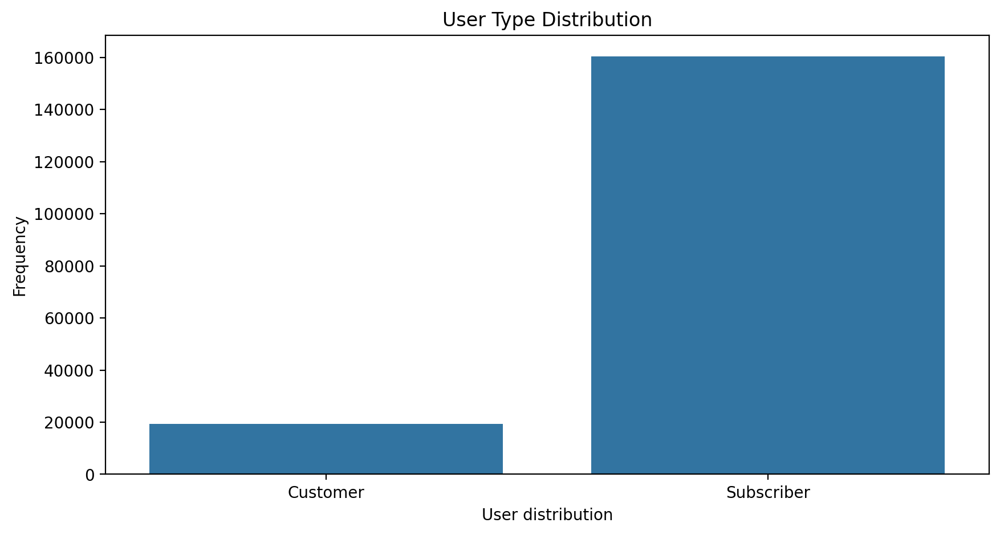

In [27]:
plt.figure(figsize = (10,5), dpi = 200)

plot = sns.countplot(data=df, x='user_type')

plt.xlabel('User distribution')
plt.ylabel('Frequency')
plt.title("User Type Distribution")

plt.show()

# <a id="2"> 2 ) What is the distribution for the bike share users on all Trips?</a>

> ### <mark>Your analsys and exploration here </mark>

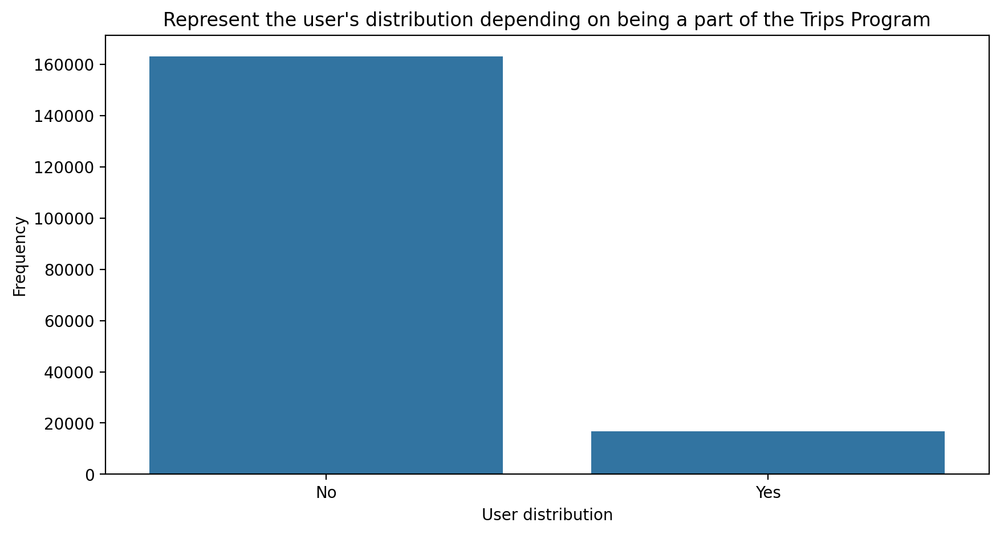

In [28]:
plt.figure(figsize = (10,5), dpi = 200)

plot = sns.countplot(data=df, x='bike_share_for_all_trip')

plt.xlabel('User distribution')
plt.ylabel('Frequency')
plt.title("Represent the user's distribution depending on being a part of the Trips Program")

plt.show()

# <a id="3"> 3 ) What is the distribution for users' ages? </a>

> ### <mark>Your analsys and exploration here </mark>

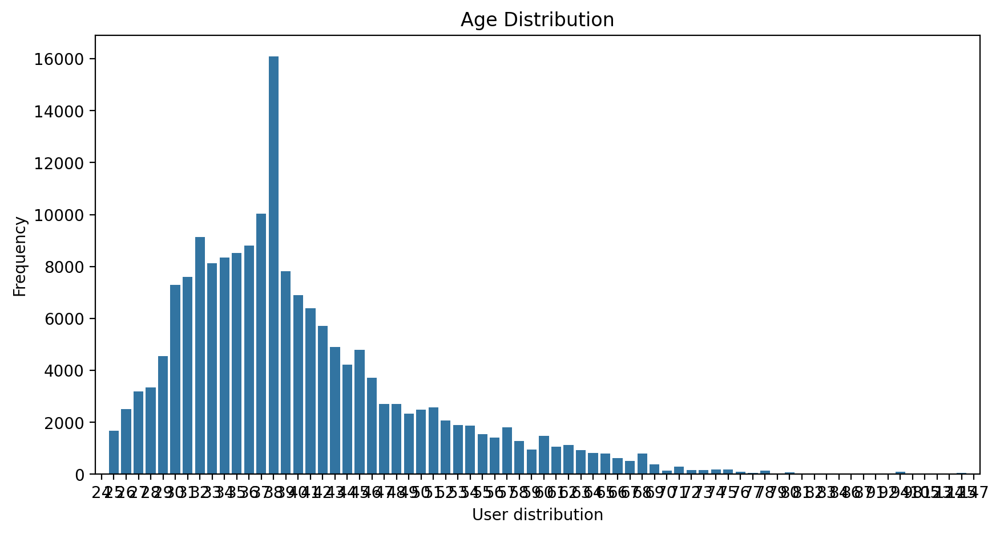

In [29]:
plt.figure(figsize = (10,5), dpi = 200)

plot = sns.countplot(data=df, x='age')

plt.xlabel('User distribution')
plt.ylabel('Frequency')
plt.title("Age Distribution")

plt.show()

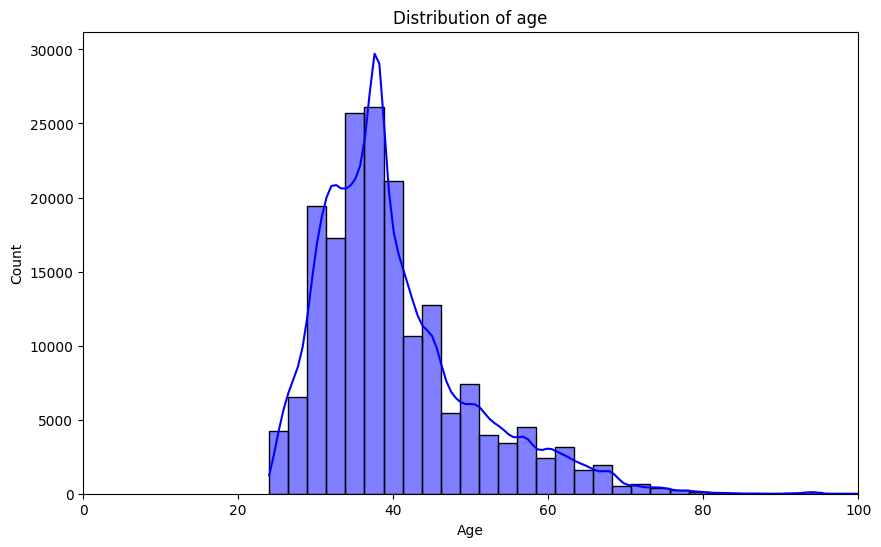

In [30]:
plt.figure(figsize=(10,6))
sns.histplot(df['age'], bins=50, kde=True, color='blue')
plt.title('Distribution of age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.xlim(0,100)  
plt.show()


# <a id="4">  4 ) . Do the users' ages have outlier values?</a>


> ### <mark>Your analsys and exploration here </mark>

In [31]:
df['age'].unique()

array([ 41,  38,  53,  51,  66,  42,  36,  33,  29,  32,  35,  37,  44,
        50,  47,  34,  28,  39,  25,  43,  30,  45,  52,  40,  54,  46,
        58,  27,  31,  48,  26,  56,  62,  49,  61,  60,  64,  57,  59,
        63,  71,  67,  65,  55,  69,  68,  80, 125,  73,  77,  74,  84,
        75,  76,  72,  70,  79,  78,  94,  82,  83, 105,  92,  24, 147,
       124,  81,  91,  86, 123,  87,  98])

Yes, there are outliers

Here is the cleaning

In [32]:
outlier_condition = df['age'] > 80
mode_age = df[~outlier_condition]['age'].mode()[0]
df.loc[outlier_condition, 'age'] = mode_age
# Define age bins and labels
bins = [20, 30, 40, 50, 60, 70, np.inf]
labels = ['20-29', '30-39', '40-49', '50-59', '60-69', '70-80']

# Create the Age_Group column
df['Age_Group'] = pd.cut(
    df['age'],
    bins=bins,
    labels=labels,
    right=False
)
df['Age_Group'].value_counts()

Age_Group
30-39    92037
40-49    44416
50-59    17924
20-29    15325
60-69     8560
70-80     1502
Name: count, dtype: int64

# <a id="5">  5 ) . What is the distribution for the trip duration in minutes? </a>

> ### <mark>Your analsys and exploration here </mark>

In [33]:
## Review the statistic for trip duration in minutes

print(df['duration_min'].describe())

count    179764.000000
mean         12.009550
std          29.018462
min           1.016667
25%           5.416667
50%           8.550000
75%          13.233333
max        1424.066667
Name: duration_min, dtype: float64


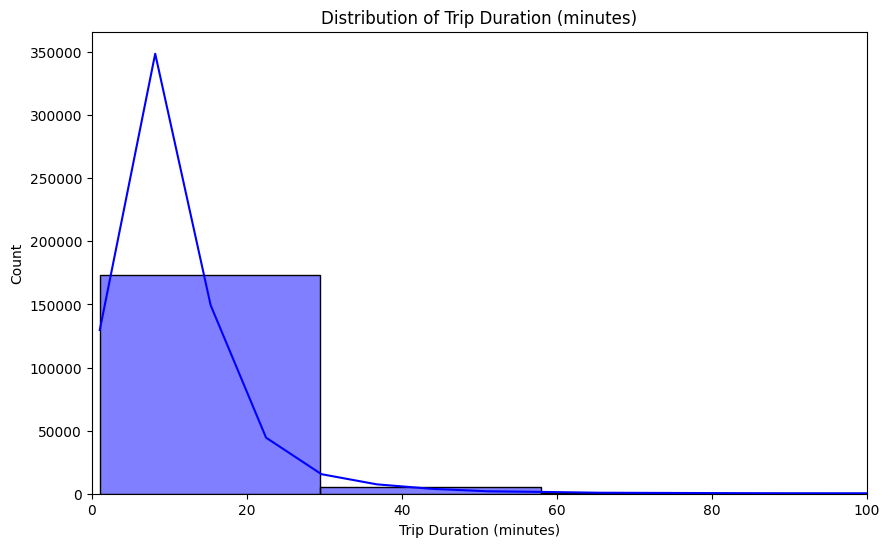

In [34]:
# Make visualization to easy get insight
plt.figure(figsize=(10,6))
sns.histplot(df['duration_min'], bins=50, kde=True, color='blue')
plt.title('Distribution of Trip Duration (minutes)')
plt.xlabel('Trip Duration (minutes)')
plt.ylabel('Count')
plt.xlim(0,100)  
plt.show()

Some organizing

In [35]:
# Define trip_dur bins and labels
bins = [0, 10, 20, 30, 40, 50, 60, np.inf]
labels = ['0-10', '10-20', '20-30', '30-40', '40-50', '50-60', '60+']

# Create the trip_dur column
df['trip_dur'] = pd.cut(
    df['duration_min'],
    bins=bins,
    labels=labels,
    right=False
)
df['trip_dur'].value_counts()

trip_dur
0-10     106495
10-20     56204
20-30     10534
30-40      3112
60+        1636
40-50      1202
50-60       581
Name: count, dtype: int64

In [36]:
fig = px.histogram(
    df,
    x='trip_dur',
    # Key: facet_col separates the data into individual columns (plots) for each user_type
    facet_col='user_type',
    category_orders={'trip_dur': labels},
    title='<b>Trip Duration Distribution by User Type</b>',
    labels={'trip_dur': 'Trip Duration'},
    color='user_type', # Colors the bars based on user type
)

# Customize the layout
fig.update_layout(
    height=500,
    bargap=0.1,
    title_x=0.5,

    yaxis2=dict(
        overlaying='y',          # Ensure it renders with the primary Y-axis container
        side='right',            # Position it on the right side of the entire figure
        showticklabels=True,     # Crucial: explicitly show ticks/labels
        matches=None,            # Ensure it has its own independent scale
    )
)


# <a id="6"> 6 ) . What is the distribution for member_gender?</a>

> ### <mark>Your analsys and exploration here </mark>

In [37]:
# Make visualization to easy get insight


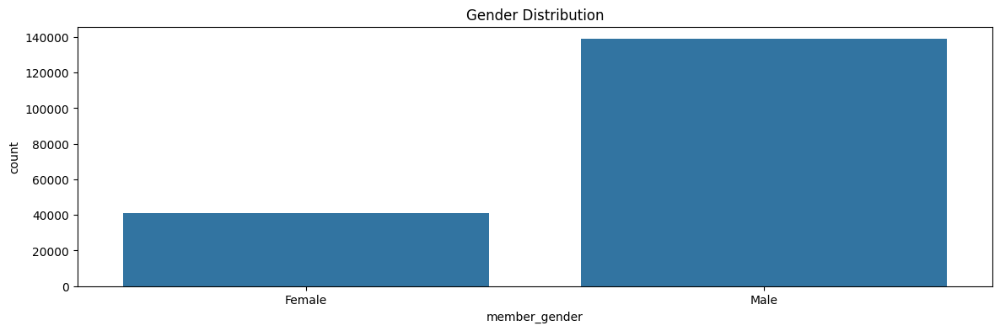

In [38]:
member_gender = df['member_gender']
plt.figure(figsize=(14,4))
sns.countplot(x=member_gender, data=df)
plt.title(f"Gender Distribution")
plt.show()

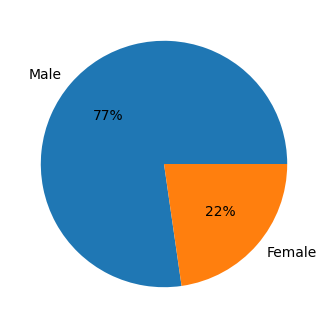

In [39]:
member_gender = df['member_gender']
plt.figure(figsize=(14,4))
unique = df['member_gender'].value_counts()
count = unique.values
catrgories = unique.index
plt.pie(count, labels= catrgories, autopct='%1.1d%%')
plt.show()

# <a id="7">    7 )  . What is the distribution for the trip duration in Hours?  </a>

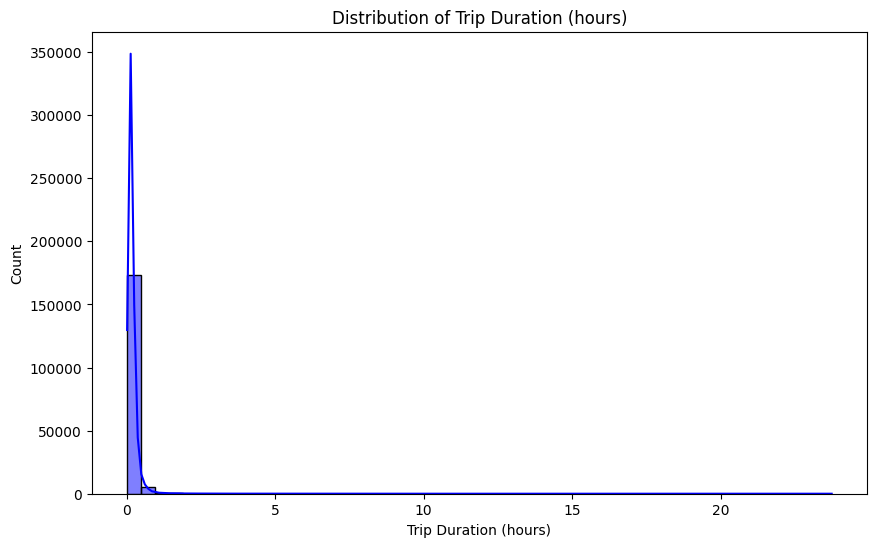

In [40]:
# Make visualization to easy get insight

plt.figure(figsize=(10,6))
sns.histplot(df['duration_hour'], bins=50, kde=True, color='blue')
plt.title('Distribution of Trip Duration (hours)')
plt.xlabel('Trip Duration (hours)')
plt.ylabel('Count')
plt.show()

> ### <mark>Your analsys and exploration here </mark>

### The variables distribution:


> The distribution of duration present that most of the trips were less than 30 minutes ( we can notice that from the minutes and the hour charts )


> And the Age distribution is ( left Skewed ) as most users age are  22 - 39


> Most users are subscribers, not Customers and  Males as shown in the charts above.



### Were there any interesting and outliers 


- We got Age outliers for more than 100 .



- The distribution of duration was strange where the minutes and the hour charts were 30 minutes or less.

# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Bivariate Exploration</p>
# <a id="111"> Bivariate Exploration</a>

Now let's investigate relationships between pairs of variables in our data.

# <a id="8"> 8) . What the average duration of trip for the categories of user type?</a>

In [41]:
# Distribution of Age by user types



# Make visualization to easy get insight


> ### <mark>Your analsys and exploration here </mark>

# <a id="9">    9 ) . How long is the duration of the trip for each gender in minutes?  </a>

In [42]:
# Make visualization to easy get insight

# ------------------------Duration distribution by member gender



# Make visualization to easy get insight


> ### <mark>Your analsys and exploration here </mark>

# <a id="10 "> 10 ) . How long is the duration of the trip for each user_type in minutes?  </a>

In [43]:

# Make visualization to easy get insight


> ### <mark>Your analsys and exploration here </mark>

In [44]:
fig = px.histogram(
    df,
    x='trip_dur',
    # Key: facet_col separates the data into individual columns (plots) for each user_type
    facet_col='user_type',
    category_orders={'trip_dur': labels},
    title='<b>Trip Duration Distribution by User Type</b>',
    labels={'trip_dur': 'Age Group (Years)'},
    color='user_type', # Colors the bars based on user type
)

# Customize the layout
fig.update_layout(
    height=500,
    bargap=0.1,
    title_x=0.5,

    yaxis2=dict(
        overlaying='y',          # Ensure it renders with the primary Y-axis container
        side='right',            # Position it on the right side of the entire figure
        showticklabels=True,     # Crucial: explicitly show ticks/labels
        matches=None,            # Ensure it has its own independent scale
    )
)

# <a id="11">  11 ) . How the user distribution depending on their Age and user_type ? </a>

In [45]:

# Make visualization to easy get insight


> ### <mark>Your analsys and exploration here </mark>

In [46]:
fig = px.histogram(
    df,
    x='Age_Group',
    # Key: facet_col separates the data into individual columns (plots) for each user_type
    facet_col='user_type',
    category_orders={'Age_Group': labels},
    title='<b>Age Distribution by User Type</b>',
    labels={'Age_Group': 'Age Group (Years)'},
    color='user_type', # Colors the bars based on user type
)

# Customize the layout
fig.update_layout(
    height=500,
    bargap=0.1,
    title_x=0.5,

    yaxis2=dict(
        overlaying='y',          # Ensure it renders with the primary Y-axis container
        side='right',            # Position it on the right side of the entire figure
        showticklabels=True,     # Crucial: explicitly show ticks/labels
        matches=None,            # Ensure it has its own independent scale
    )
)

fig.update_yaxes(title_text='Number of Users')

#  <a id="12"> 12 ). How the user distribution depending on their Age and member_gender ?</a>

In [47]:
# Make visualization to easy get insight


> ### <mark>Your analsys and exploration here </mark>

In [48]:
fig = px.histogram(
    df,
    x='Age_Group',
    # Key: facet_col separates the data into individual columns (plots) for each user_type
    facet_col='member_gender',
    category_orders={'Age_Group': labels},
    title='<b>Age Distribution by Gender</b>',
    labels={'Age_Group': 'Age Group (Years)'},
    color='member_gender', # Colors the bars based on user type
)

# Customize the layout
fig.update_layout(
    height=500,
    bargap=0.1,
    title_x=0.5,

    # yaxis2=dict(
    #     overlaying='y',          # Ensure it renders with the primary Y-axis container
    #     side='right',            # Position it on the right side of the entire figure
    #     showticklabels=True,     # Crucial: explicitly show ticks/labels
    #     matches=None,            # Ensure it has its own independent scale
    # )
)

fig.update_yaxes(title_text='Number of Users')

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

> ...................


### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

> ....................

# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Multivariate Exploration</p>
# <a id="1111"> Multivariate Exploration </a>

> Create plots of three or more variables to investigate your data even
further. Make sure that your investigations are justified, and follow from
your work in the previous sections.

In [49]:
## check your work 



# <a id="13">  13 ) . What is the  Correlation between each variable in the dataset?</a>

In [50]:
# Make visualization to easy get insight

str_c = ['user_type','member_gender','bike_share_for_all_trip']
encoder = OneHotEncoder(cols= str_c, drop_invariant=True)
encoded_df = encoder.fit_transform(df)
encoded_df.head(5)
numeric_df = encoded_df.select_dtypes(include=['number'])

en_corr_matrix = numeric_df.corr()

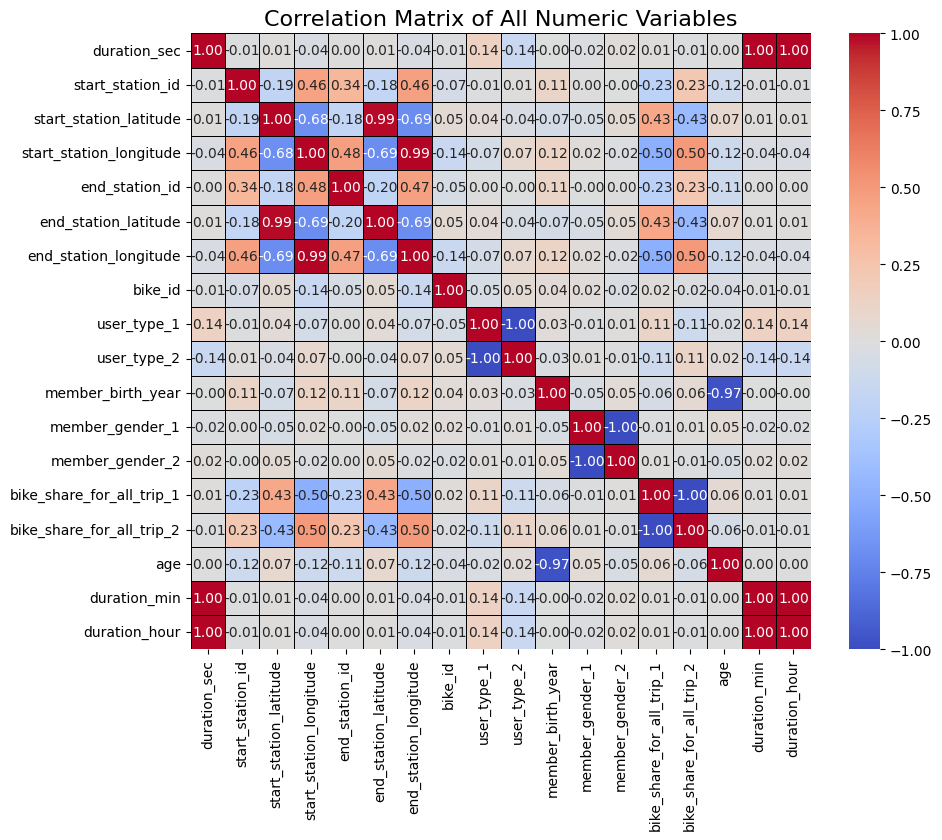

In [51]:
plt.figure(figsize=(10, 8))
sns.heatmap(
    en_corr_matrix,
    annot=True,          # Show the correlation values
    fmt=".2f",           # Format to two decimal places
    cmap='coolwarm',     # Color map (cool colors for negative, warm for positive)
    linewidths=.5,
    linecolor='black'
)

plt.title('Correlation Matrix of All Numeric Variables', fontsize=16)
plt.show()

In [52]:
fig = px.imshow(en_corr_matrix,
          text_auto=".2f",
          color_continuous_scale="RdBu_r",
          title="Correlation Heatmap")
fig.update_layout(
    width = 1000,
    height = 750,
    xaxis_title = "Features",
    yaxis_title = "Features"
)



> ### <mark>Your analsys and exploration here </mark>

Example usage
- There is `no Correlation` for any variable with time ( `duration sec /minutes/hours`)



# <a id="14"> 14 )  .  What is the  Correlation between `specific numeric variables` in the dataset?</a>


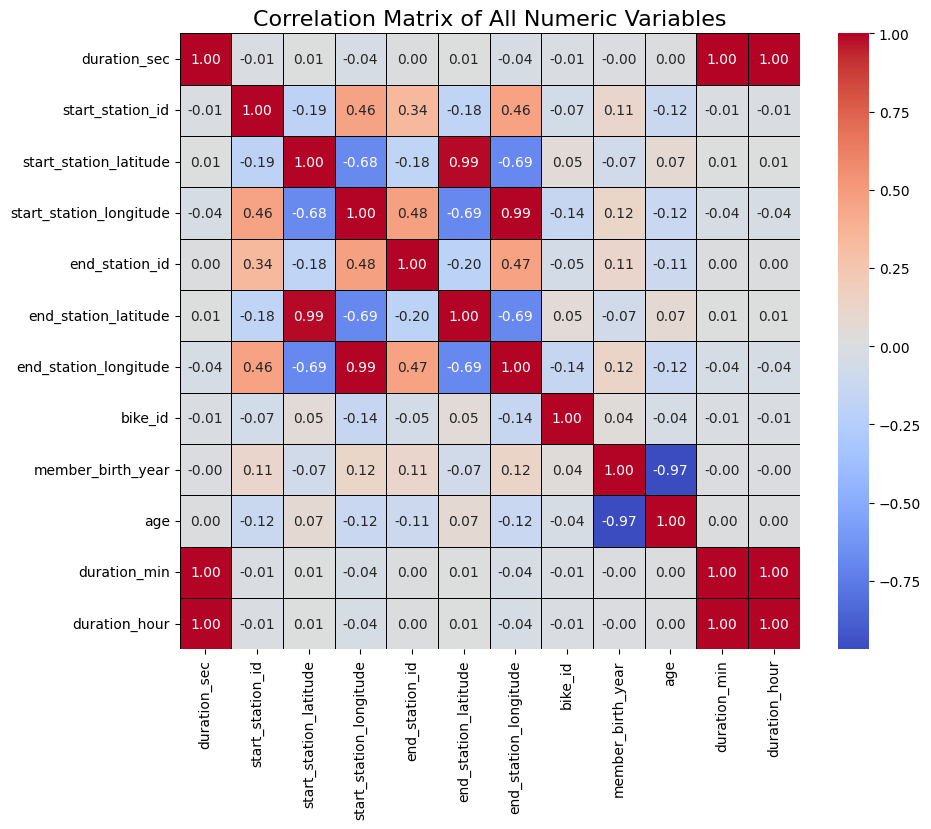

In [53]:
# Make visualization to easy get insight

numeric_df = df.select_dtypes(include=['number'])

correlation_matrix = numeric_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,          # Show the correlation values
    fmt=".2f",           # Format to two decimal places
    cmap='coolwarm',     # Color map (cool colors for negative, warm for positive)
    linewidths=.5,
    linecolor='black'
)
plt.title('Correlation Matrix of All Numeric Variables', fontsize=16)
plt.show()

In [54]:
fig = px.imshow(correlation_matrix,
          text_auto=".2f",
          color_continuous_scale="RdBu_r",
          title="Correlation Heatmap")
fig.update_layout(
    width = 1000,
    height = 750,
    xaxis_title = "Features",
    yaxis_title = "Features"
)

> ### <mark>Your analsys and exploration here </mark>

Example usage
- There is `no Correlation` for any variable with time ( `duration sec /minutes`)




- There is a strong negative correlation between member_birth_year and age




- 




# <a id="15">  15 ) What is the  Correlation between data_stat variables in the dataset?</a>


In [55]:

"""""This time I will use heatmap  to explain how Correlation between data_stat variables

in the dataset in more clear and specific percentage"""

# Make visualization to easy get insight



'""This time I will use heatmap  to explain how Correlation between data_stat variables\n\nin the dataset in more clear and specific percentage'

> ### <mark>The above charts show how Correlation between specific numeric variables in the dataset using heatmap plots  </mark>



**Actually the `heat map`  display the above ideas in clear percentages**



- There is `no Correlation` for any variable with time ( `duration sec /minutes`)




- There is a `negative  Correlation` between  member_birth_year  and age which normal.




- There is `no significant Correlation` for any variable with `bike_id `



# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Conclusions</p>
# <a id="1100"> Conclusions </a>

#example
- Most users were Male.


- Most users were subscribers

- 

- 



## limitation 
example
- We got missing data which we fix some of them .

- We needed to calculate more data like age
